In [1]:
#libraries
import pandas as pd 
import geopandas as gdp
import plotly.express as px

In [2]:
#acquire data from csv the county poverty 
poverty = pd.read_csv('Poverty2023.csv')
#print first few rows
#poverty.head()
#extract only rows where attribute is PCTPOVALL_2023
poverty_data = poverty[poverty['Attribute'] == 'PCTPOVALL_2023'].copy()
#select and rename columns
poverty_data = poverty_data[['FIPS_Code', 'Area_Name', 'Value']]
#ensure FIPS_Code is a 5-character string
poverty_data['FIPS_Code'] = poverty_data['FIPS_Code'].astype(str).str.zfill(5)
#print first few rows
poverty.head()

,FIPS_Code,Stabr,Area_Name,Attribute,Value
0,0,US,United States,POVALL_2023,40763043.0
1,0,US,United States,CI90LBALL_2023,40485829.0
2,0,US,United States,CI90UBALL_2023,41040257.0
3,0,US,United States,PCTPOVALL_2023,12.5
4,0,US,United States,CI90LBALLP_2023,12.4


In [3]:
#acquire data from shp file
county2018 = gdp.read_file("cb_2018_us_county_20m.shp")
#county2018.head()
#ensure FIPS_Code exists in county data
county2018['FIPS_Code'] = county2018['STATEFP'] + county2018['COUNTYFP']
#check how looks
county2018.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,FIPS_Code
0,37,017,01026336,0500000US37017,37017,Bladen,06,2265887723,33010866,"POLYGON ((-78.902 34.83527, -78.7996 34.85086,...",37017
1,37,167,01025844,0500000US37167,37167,Stanly,06,1023370459,25242751,"POLYGON ((-80.49737 35.2021, -80.29542 35.5029...",37167
2,39,153,01074088,0500000US39153,39153,Summit,06,1069181981,18958267,"POLYGON ((-81.68699 41.13596, -81.68495 41.277...",39153
3,42,113,01213687,0500000US42113,42113,Sullivan,06,1165338428,6617028,"POLYGON ((-76.81373 41.59003, -76.22014 41.541...",42113
4,48,459,01384015,0500000US48459,48459,Upshur,06,1509910100,24878888,"POLYGON ((-95.15274 32.66095, -95.15211 32.902...",48459


In [4]:
#merge county boundaries with poverty data
merged = county2018.merge(poverty_data, on='FIPS_Code', how='left')
#reorder and rename columns to match expected format
merged = merged[['STATEFP', 'COUNTYFP', 'COUNTYNS', 'AFFGEOID', 'NAME', 'LSAD', 'ALAND', 'AWATER', 'geometry', 'FIPS_Code', 'Area_Name', 'Value']]
#check 
merged

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,NAME,LSAD,ALAND,AWATER,geometry,FIPS_Code,Area_Name,Value
0,37,017,01026336,0500000US37017,Bladen,06,2265887723,33010866,"POLYGON ((-78.902 34.83527, -78.7996 34.85086,...",37017,Bladen County,19.3
1,37,167,01025844,0500000US37167,Stanly,06,1023370459,25242751,"POLYGON ((-80.49737 35.2021, -80.29542 35.5029...",37167,Stanly County,11.0
2,39,153,01074088,0500000US39153,Summit,06,1069181981,18958267,"POLYGON ((-81.68699 41.13596, -81.68495 41.277...",39153,Summit County,12.9
3,42,113,01213687,0500000US42113,Sullivan,06,1165338428,6617028,"POLYGON ((-76.81373 41.59003, -76.22014 41.541...",42113,Sullivan County,13.8
4,48,459,01384015,0500000US48459,Upshur,06,1509910100,24878888,"POLYGON ((-95.15274 32.66095, -95.15211 32.902...",48459,Upshur County,13.9
...,...,...,...,...,...,...,...,...,...,...,...,...
3215,38,005,01034216,0500000US38005,Benson,06,3596569006,131708143,"POLYGON ((-99.84661 48.3713, -99.49292 48.3709...",38005,Benson County,22.7
3216,72,079,01804520,0500000US72079,Lajas,13,155287827,106643202,"POLYGON ((-67.10904 18.05608, -67.06791 18.066...",72079,NaN,NaN
3217,31,159,00835901,0500000US31159,Seward,06,1479995670,11542537,"POLYGON ((-97.36812 41.04695, -96.91094 41.046...",31159,Seward County,6.9
3218,37,023,01008539,0500000US37023,Burke,06,1311146878,20719896,"POLYGON ((-81.90665 35.88338, -81.94319 35.960...",37023,Burke County,15.9


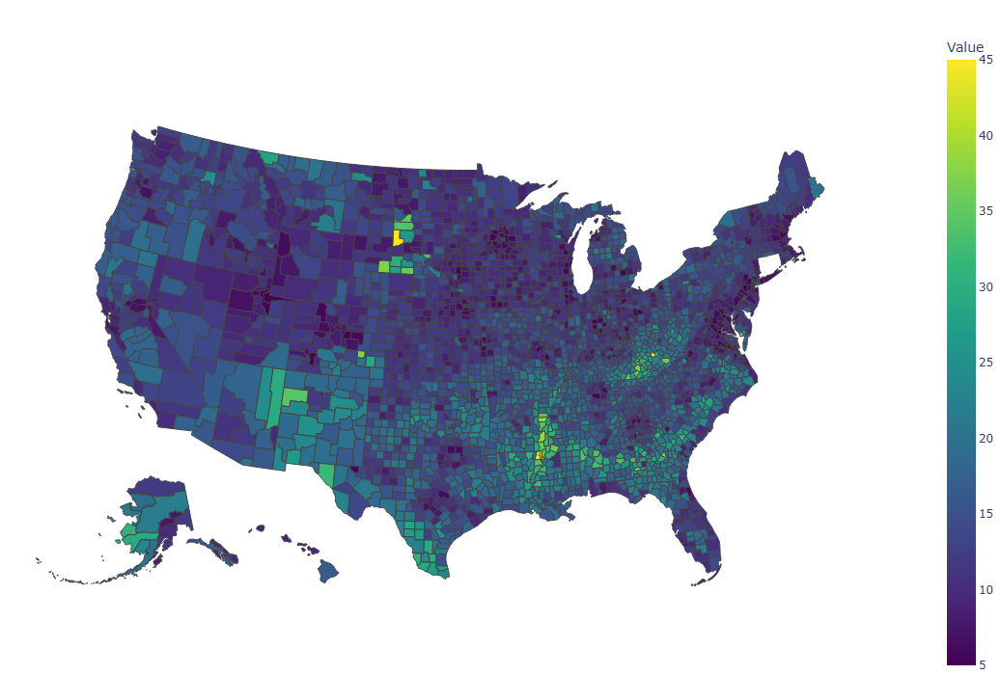

In [5]:
#convert merged to GeoJSON
geojsonDict = merged.__geo_interface__

#create choropleth map
fig = px.choropleth(
    merged,
    geojson=geojsonDict,
    featureidkey="properties.FIPS_Code",
    locations="FIPS_Code",
    color="Value",
    color_continuous_scale="Viridis",
    range_color=(5, 45),
    height=700 
)
#properly zooming into USA
fig.update_geos(
    projection_type="albers usa", 
    showland=True,
    landcolor="white",
    lakecolor="lightblue",
    visible=False
)

#layout settings
fig.update_layout(
    margin={"r": 0, "t": 30, "l": 0, "b": 0},
    dragmode=False
)

fig.show()